# TensorFlow Models

## Imports

In [1]:
import datetime
import os
import random

import IPython
import IPython.display
import keras
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import tensorflow as tf

import auxiliaries as aux

In [2]:
tf.__version__

'2.16.2'

## Setup

In [3]:
# Develop Testing and Applied Window
species = 'Moose'
file_name = 'yl1'

years_to_predict = 1
time_intervals = 3 if species == 'Moose' else 4

tf_tut_window = aux.WindowGenerator(input_width=aux.OUT_STEPS,
                               label_width=aux.OUT_STEPS,
                               shift=aux.OUT_STEPS,
                               cv_name=f'{species}/{file_name}')

reg_window = aux.RegressiveWindow(f'{species}/{file_name}')
classification_window = aux.ClassificationWindow(f'{species}/{file_name}', 3)

results = {}

print(f'{species}:')
print('------Tensorflow Tutorial Window------')
print(f'Original Data Size: {len(tf_tut_window.orig_df)}')
print(f'Training Data Size: {len(tf_tut_window.train_df)}')
print(f'Validation Data Size: {len(tf_tut_window.val_df)}')
print(f'Testing Data Size: {len(tf_tut_window.test_df)}')

print()

print('------Regressive Window------')
print(f'Original Data Size: {len(reg_window.orig_df)}')
print(f'Training Data Size: {len(reg_window.train_df)}')
print(f'Testing Data Size: {len(reg_window.test_df)}')

print()

print('------Classification Window------')
print(f'Original Data Size: {len(classification_window.orig_df)}')
print(f'Training Data Size: {len(classification_window.train_df)}')
print(f'Testing Data Size: {len(classification_window.test_df)}')

Epoch 1/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 118s 212ms/step - loss: 0.6510 - mean_absolute_error: 0.6329 - mean_squared_error: 0.6510 - val_loss: 0.2814 - val_mean_absolute_error: 0.4259 - val_mean_squared_error: 0.2814
Epoch 2/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2979 - mean_absolute_error: 0.4249 - mean_squared_error: 0.2979 - val_loss: 0.3217 - val_mean_absolute_error: 0.4452 - val_mean_squared_error: 0.3217
Epoch 3/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.2916 - mean_absolute_error: 0.4207 - mean_squared_error: 0.2916 - val_loss: 0.2972 - val_mean_absolute_error: 0.4350 - val_mean_squared_error: 0.2972
Moose:
------Tensorflow Tutorial Window------
Original Data Size: 7692
Training Data Size: 5384
Validation Data Size: 1538
Testing Data Size: 770

------Regressive Window------
Original Data Size: 7692
Training Data Size: 5384
Testing Data Size: 2308

------Classification Window------
Original Data Size: 7692
Training Data Size: 6923
Testing Data Size:

In [4]:
print('------Tensorflow Tutorial Window------')
print(f'Training Mean:\n{tf_tut_window.train_mean}')
print(f'Training St. Dev.:\n{tf_tut_window.train_std}')

print()

print('------Regressive Window------')
print(f'Training Mean:\n{reg_window.train_df.mean()}')
print(f'Training Std. Dev.:\n{reg_window.train_df.std()}')

print()

print('------Classification Window------')
print(f'Training Mean:\n{classification_window.train_df.mean()}')
print(f'Training Std. Dev.:\n{classification_window.train_df.std()}')

------Tensorflow Tutorial Window------
Training Mean:
longitude   -111.409088
latitude      57.369493
altitude     294.173912
dtype: float64
Training St. Dev.:
longitude     0.030021
latitude      0.031195
altitude     23.523366
dtype: float64

------Regressive Window------
Training Mean:
external-temperature      7.876300
longitude              -111.408285
latitude                 57.369469
altitude                293.507836
month                     6.528789
day                      15.564264
dtype: float64
Training Std. Dev.:
external-temperature    12.727116
longitude                0.031806
latitude                 0.032123
altitude                23.451857
month                    3.181591
day                      8.730784
dtype: float64

------Classification Window------
Training Mean:
external-temperature      7.824931
longitude              -111.408359
latitude                 57.369499
altitude                293.436983
month                     6.520006
day                  

## Question 1 Models: Predict Future Position with Past Position
----

### Autoregressive (AR) Model

In [5]:
# Initialize Model
autoregressive_model = aux.FeedBack(units=32, out_steps=aux.OUT_STEPS, num_vars=3)
history = aux.compile_and_fit(autoregressive_model, tf_tut_window)

Epoch 1/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 118s 214ms/step - loss: 0.8428 - mean_absolute_error: 0.7278 - mean_squared_error: 0.8428 - val_loss: 0.6871 - val_mean_absolute_error: 0.6148 - val_mean_squared_error: 0.6871
Epoch 2/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.5632 - mean_absolute_error: 0.5437 - mean_squared_error: 0.5632 - val_loss: 0.5815 - val_mean_absolute_error: 0.5626 - val_mean_squared_error: 0.5815
Epoch 3/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.5933 - mean_absolute_error: 0.5541 - mean_squared_error: 0.5933 - val_loss: 0.6037 - val_mean_absolute_error: 0.5957 - val_mean_squared_error: 0.6037
Epoch 4/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - loss: 0.5254 - mean_absolute_error: 0.5193 - mean_squared_error: 0.5254 - val_loss: 0.5630 - val_mean_absolute_error: 0.5724 - val_mean_squared_error: 0.5630
Epoch 5/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - loss: 0.5137 - mean_absolute_error: 0.5095 - mean_squared_error: 0.5137 - val_loss: 0.56

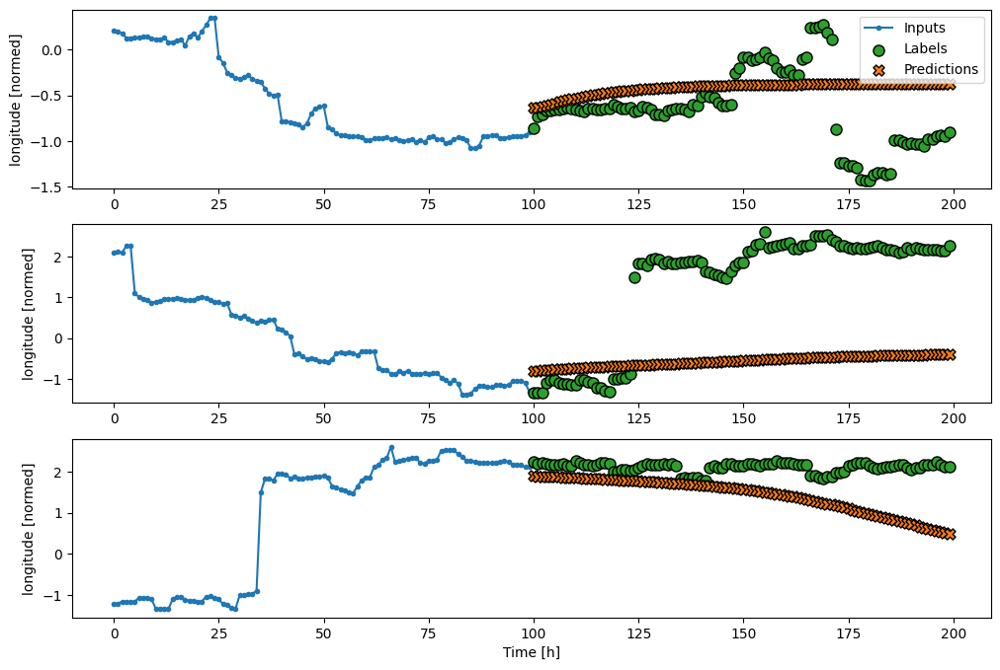

In [6]:
# Plot out how the model conforms to longitude training data
tf_tut_window.plot(autoregressive_model, plot_col='longitude')

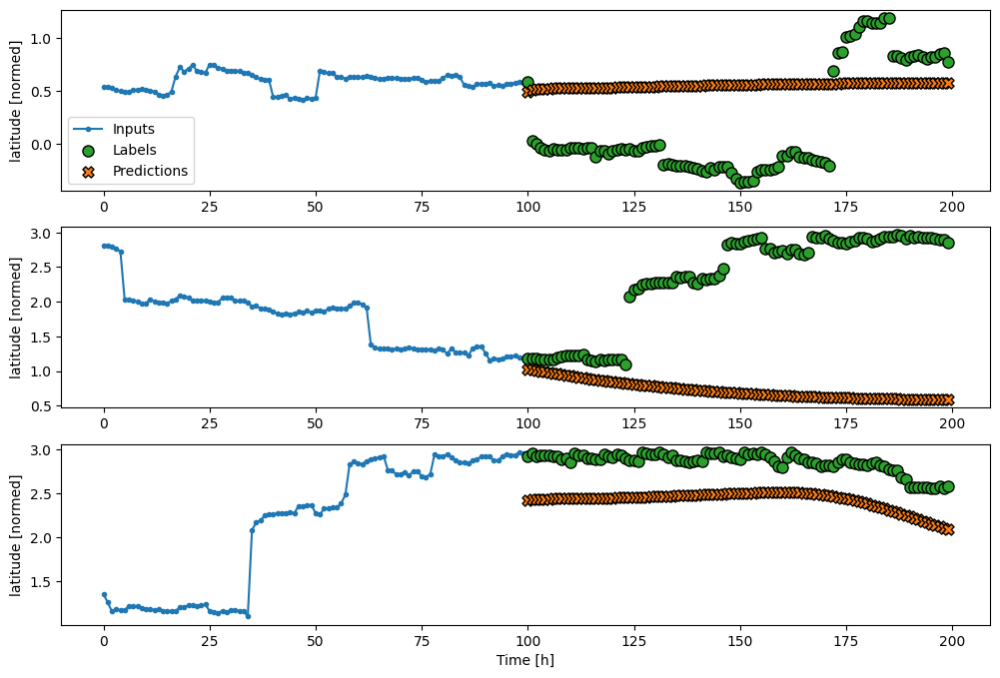

In [7]:
# Plot out how the model conforms to latitude training data
tf_tut_window.plot(autoregressive_model, plot_col='latitude')

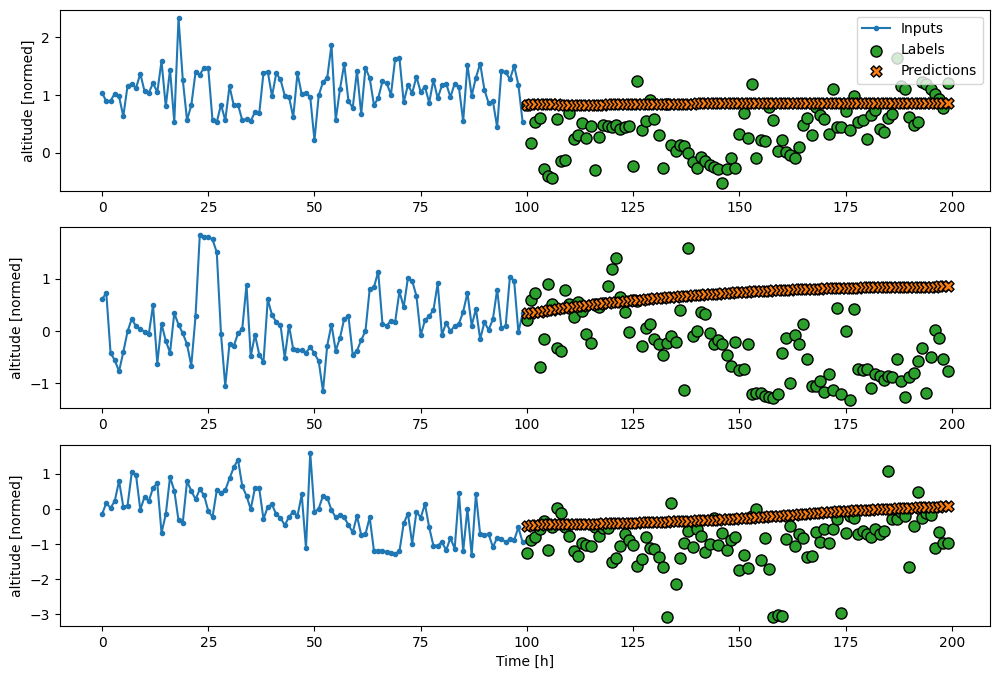

In [8]:
# Plot out how the model conforms to altitude training data
tf_tut_window.plot(autoregressive_model, plot_col='altitude')

In [9]:
results['Autoregressive'] = autoregressive_model.evaluate(tf_tut_window.test, verbose=1, return_dict=True)

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0683 - mean_absolute_error: 0.7692 - mean_squared_error: 1.0683


In [10]:
autoregressive_model.save(f'ModelFiles/SavedModels/{species}/{file_name}_autoregressive.keras')
# Generate CSV file for future positions
tf_tut_window.extend_to_csv(url_dest=f'{species}/{file_name}_autoregressive', species=species, model=autoregressive_model, number_of_out_steps=(years_to_predict*8760)//(aux.OUT_STEPS*time_intervals))

In [11]:
# Generate CSV file analyzing testing set results
def graph_tf_tutorial(model, window, url_dest):
    # Prepare input and label data
    input_data, label_data = next(iter(window.edge_data))

    # Prepare DataFrames
    predicted_df = pd.DataFrame(model(input_data)[0].numpy(), columns=window.edge_df.columns)*window.train_std + window.train_mean
    input_df = pd.DataFrame(input_data[0].numpy(), columns=window.edge_df.columns)*window.train_std + window.train_mean
    label_df = pd.DataFrame(label_data[0].numpy(), columns=window.edge_df.columns)*window.train_std + window.train_mean

    input_df['timestamp'] = window.date_time.iloc[-(2*aux.OUT_STEPS):-aux.OUT_STEPS].reset_index(drop=True)
    label_df['timestamp'] = window.date_time.iloc[-aux.OUT_STEPS:].reset_index(drop=True)
    predicted_df['timestamp'] = window.date_time.iloc[-aux.OUT_STEPS:].reset_index(drop=True)

    input_df['id'] = ['Inputted Past Positions' for _ in range(len(input_df))]
    label_df['id'] = ['Original Future Positions' for _ in range(len(label_df))]
    predicted_df['id'] = ['Predicted Future Positions' for _ in range(len(predicted_df))]

    # Combine DataFrames
    full_df = pd.concat([input_df, label_df, predicted_df], ignore_index=True)
    full_df.to_csv(url_dest, index=False)

    return full_df

# Load is here to account for autoregressive model changing with each input
autoregressive_model = tf.keras.models.load_model(f'ModelFiles/SavedModels/{species}/{file_name}_autoregressive.keras', custom_objects={'FeedBack':aux.FeedBack})

graph_tf_tutorial(autoregressive_model, tf_tut_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_autoregressive_EdgeAnalysis.csv')

,longitude,latitude,altitude,timestamp,id
0,-111.387324,57.399642,296.550000,2012-10-02 01:00:53,Inputted Past Positions
1,-111.369510,57.427271,322.410000,2012-10-02 07:00:47,Inputted Past Positions
2,-111.369607,57.427383,314.390000,2012-10-02 10:00:47,Inputted Past Positions
3,-111.369955,57.427469,316.600000,2012-10-02 13:00:43,Inputted Past Positions
4,-111.369106,57.430020,315.440000,2012-10-02 16:00:52,Inputted Past Positions
...,...,...,...,...,...
295,-111.391265,57.436721,295.481670,2012-10-28 04:02:23,Predicted Future Positions
296,-111.392039,57.436204,295.605813,2012-10-28 07:00:49,Predicted Future Positions
297,-111.392814,57.435683,295.731518,2012-10-28 10:00:53,Predicted Future Positions
298,-111.393589,57.435158,295.858898,2012-10-28 13:00:44,Predicted Future Positions


## RNN Single Shot Model

In [12]:
# Initialize Model
multi_lstm_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, lstm_units].
    # Adding more `lstm_units` just overfits more quickly.
    tf.keras.layers.LSTM(32, return_sequences=False),
    # Shape => [batch, out_steps*features].
    tf.keras.layers.Dense(aux.OUT_STEPS*len(tf_tut_window.column_indices),
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features].
    tf.keras.layers.Reshape([aux.OUT_STEPS, len(tf_tut_window.column_indices)])
])
history = aux.compile_and_fit(multi_lstm_model, tf_tut_window)

Epoch 1/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.8043 - mean_absolute_error: 0.6958 - mean_squared_error: 0.8043 - val_loss: 0.5500 - val_mean_absolute_error: 0.5553 - val_mean_squared_error: 0.5500
Epoch 2/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.5058 - mean_absolute_error: 0.5142 - mean_squared_error: 0.5058 - val_loss: 0.5285 - val_mean_absolute_error: 0.5342 - val_mean_squared_error: 0.5285
Epoch 3/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.4506 - mean_absolute_error: 0.4746 - mean_squared_error: 0.4506 - val_loss: 0.5119 - val_mean_absolute_error: 0.5198 - val_mean_squared_error: 0.5119
Epoch 4/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.4263 - mean_absolute_error: 0.4613 - mean_squared_error: 0.4263 - val_loss: 0.5352 - val_mean_absolute_error: 0.5406 - val_mean_squared_error: 0.5352
Epoch 5/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4048 - mean_absolute_error: 0.4566 - mean_squared_error: 0.4048 - val_loss: 0.6165 - 

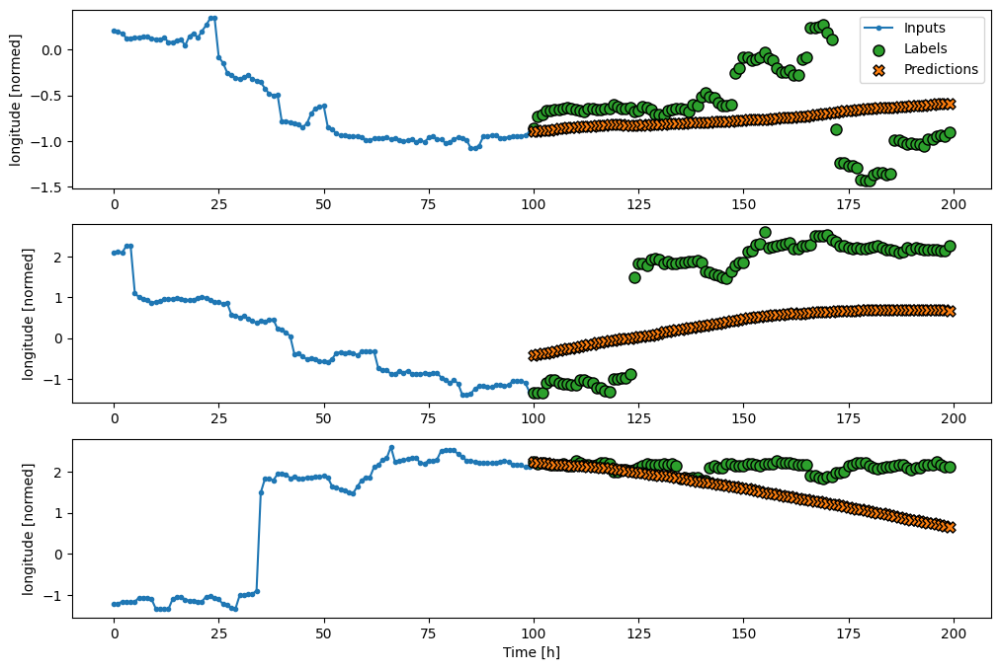

In [13]:
# Plot out how the model conforms to longitude training data
tf_tut_window.plot(multi_lstm_model, plot_col='longitude')

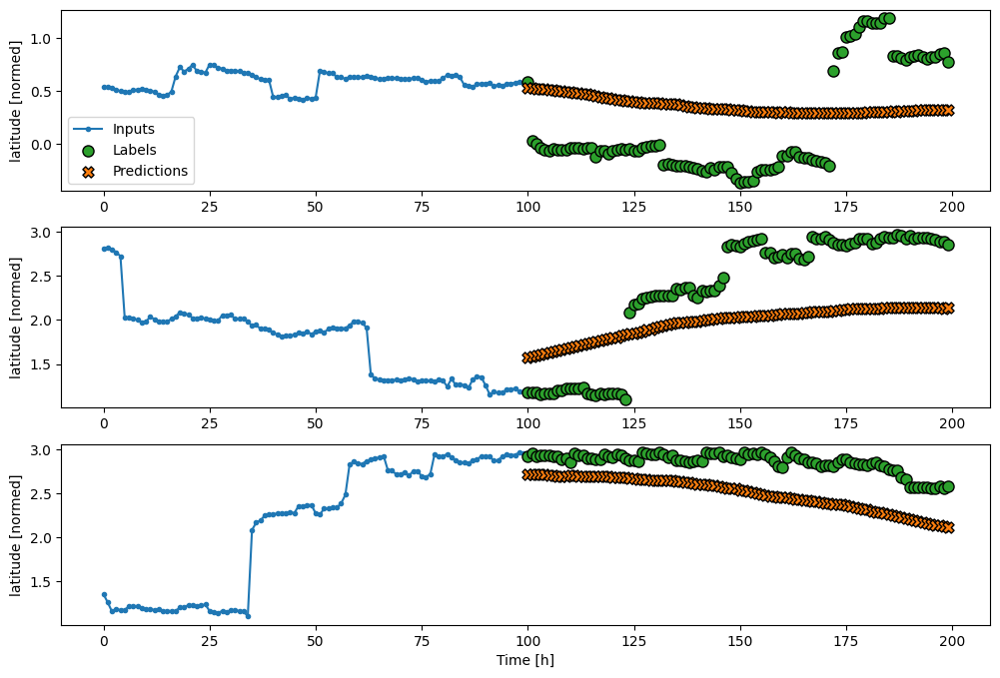

In [14]:
# Plot out how the model conforms to latitude training data
tf_tut_window.plot(multi_lstm_model, plot_col='latitude')

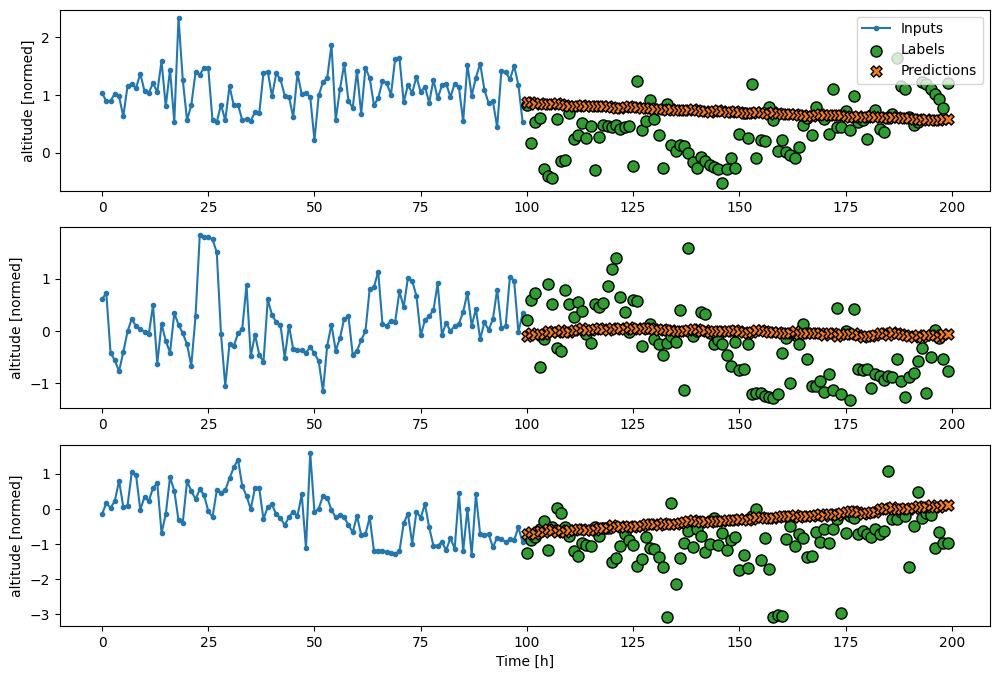

In [15]:
# Plot out how the model conforms to altitude training data
tf_tut_window.plot(multi_lstm_model, plot_col='altitude')

In [16]:
results['Single Shot'] = multi_lstm_model.evaluate(tf_tut_window.test, verbose=1, return_dict=True)

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9209 - mean_absolute_error: 0.7176 - mean_squared_error: 0.9209


In [17]:
multi_lstm_model.save(f'ModelFiles/SavedModels/{species}/{file_name}_singleshot.keras')
# Generate CSV file for future positions
tf_tut_window.extend_to_csv(url_dest=f'{species}/{file_name}_singleshot', species=species, model=multi_lstm_model, number_of_out_steps=(years_to_predict*8760)//(aux.OUT_STEPS*time_intervals))

In [18]:
# Generate CSV file analyzing testing set results
graph_tf_tutorial(multi_lstm_model, tf_tut_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_singleshot_EdgeAnalysis.csv')

,longitude,latitude,altitude,timestamp,id
0,-111.387324,57.399642,296.550000,2012-10-02 01:00:53,Inputted Past Positions
1,-111.369510,57.427271,322.410000,2012-10-02 07:00:47,Inputted Past Positions
2,-111.369607,57.427383,314.390000,2012-10-02 10:00:47,Inputted Past Positions
3,-111.369955,57.427469,316.600000,2012-10-02 13:00:43,Inputted Past Positions
4,-111.369106,57.430020,315.440000,2012-10-02 16:00:52,Inputted Past Positions
...,...,...,...,...,...
295,-111.387995,57.438527,296.519200,2012-10-28 04:02:23,Predicted Future Positions
296,-111.388622,57.438168,295.649691,2012-10-28 07:00:49,Predicted Future Positions
297,-111.389196,57.437967,295.111487,2012-10-28 10:00:53,Predicted Future Positions
298,-111.389831,57.437564,296.682283,2012-10-28 13:00:44,Predicted Future Positions


## Question 2 Models: Predict Current Position with Current Environmental Conditions
----

### Regressive Model

In [19]:
# Initialize model
regressive_model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(256, input_shape=(1,3), activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(3)
])
reg_window.model_compilation_and_fitting(regressive_model)

Epoch 1/20


c:\Users\Imper\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


169/169 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.8046 - mean_absolute_error: 0.7139 - mean_squared_error: 0.8046
Epoch 2/20
 26/169 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6555 - mean_absolute_error: 0.6351 - mean_squared_error: 0.6555

c:\Users\Imper\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\callbacks\early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss,mean_absolute_error,mean_squared_error
  current = self.get_monitor_value(logs)


169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6527 - mean_absolute_error: 0.6384 - mean_squared_error: 0.6527
Epoch 3/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.5949 - mean_absolute_error: 0.6059 - mean_squared_error: 0.5949
Epoch 4/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5731 - mean_absolute_error: 0.5938 - mean_squared_error: 0.5731
Epoch 5/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.5378 - mean_absolute_error: 0.5690 - mean_squared_error: 0.5378
Epoch 6/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.5430 - mean_absolute_error: 0.5708 - mean_squared_error: 0.5430
Epoch 7/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.5304 - mean_absolute_error: 0.5600 - mean_squared_error: 0.5304
Epoch 8/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.5042 - mean_absolute_error: 0.5454 - mean_squared_error: 0.5042
Epoch 9/20
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5173 - mean_absolute_error: 0.5520 - mean_squared_error: 0.5173
Epo

In [20]:
results['Regressive Model'] = regressive_model.evaluate(reg_window.test_input, reg_window.test_label, verbose=1, return_dict=True)

73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3990 - mean_absolute_error: 0.4645 - mean_squared_error: 0.3990 


In [21]:
# Generate CSV file for future positions
reg_window.csv_extension(f'{species}/{file_name}_regressive', species, regressive_model, out_steps=(years_to_predict*8760)//time_intervals)

In [22]:
regressive_model.save(f'ModelFiles/SavedModels/{species}/{file_name}_regressive.keras')

In [23]:
# Generate CSV file analyzing testing set results
def graph_regressive(model, window, url_dest):
    test_df = window.test_df
    test_df['timestamp'] = window.timeline

    initial_df = test_df[['timestamp', 'month', 'day', 'external-temperature', 'longitude', 'latitude', 'altitude']]
    initial_df['id'] = ['original' for _ in range(len(initial_df))]

    data = {
        'timestamp': [],
        'month': [],
        'day': [],
        'external-temperature': [],
        'longitude': [],
        'latitude': [],
        'altitude': [],
        'id': []
    }

    for i in range(len(initial_df)):
        section = initial_df.iloc[i]

        timestamp = section['timestamp']
        month = section['month']
        day = section['day']
        external_temp = section['external-temperature']

        if isinstance(model, tf.keras.Sequential):
            output_fields = model(np.array([external_temp, month, day]).reshape([1, 1, 3]))*window.train_df[['longitude', 'latitude', 'altitude']].std() + window.train_df[['longitude', 'latitude', 'altitude']].mean()
            output_fields = output_fields.numpy()[0][0]
        elif isinstance(model, sklearn.neighbors.KNeighborsRegressor):
            output_fields = model.predict([[external_temp, month, day]])[0]*window.train_df[['longitude', 'latitude', 'altitude']].std() + window.train_df[['longitude', 'latitude', 'altitude']].mean()
            output_fields = output_fields.values

        longitude = output_fields[0]
        latitude = output_fields[1]
        altitude = output_fields[2]
        id = 'predicted'

        data['timestamp'].append(timestamp)
        data['month'].append(month)
        data['day'].append(day)
        data['external-temperature'].append(external_temp)
        data['longitude'].append(longitude)
        data['latitude'].append(latitude)
        data['altitude'].append(altitude)
        data['id'].append(id)

    add_on_df = pd.DataFrame(data)
    
    full_df = pd.concat([initial_df, add_on_df], ignore_index=True)
    full_df.to_csv(url_dest, index=False)

    return full_df

graph_regressive(regressive_model, reg_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_regressive_EdgeAnalysis.csv')

C:\Users\Imper\AppData\Local\Temp\ipykernel_39916\3972214981.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_df['id'] = ['original' for _ in range(len(initial_df))]


,timestamp,month,day,external-temperature,longitude,latitude,altitude,id
0,2010-03-06 01:00:54,3,6,7.0,-111.399967,57.371726,310.470000,original
1,2010-03-06 22:00:47,3,6,11.0,-111.398069,57.368303,311.190000,original
2,2010-03-08 10:00:44,3,8,3.0,-111.394943,57.372767,315.780000,original
3,2010-03-08 16:00:50,3,8,4.0,-111.392509,57.373987,306.010000,original
4,2010-03-09 01:00:54,3,9,4.0,-111.387348,57.374364,367.030000,original
...,...,...,...,...,...,...,...,...
4611,2012-10-25 13:02:09,10,25,3.0,-111.304916,57.563553,440.545105,predicted
4612,2012-10-26 01:01:48,10,26,2.0,-111.308533,57.564522,438.452454,predicted
4613,2012-10-26 13:01:19,10,26,-1.0,-111.343971,57.561947,423.245178,predicted
4614,2012-10-28 01:01:48,10,28,-1.0,-111.335960,57.559555,424.478363,predicted


### K-Neighbors Regressor

In [24]:
# Reshape input and outputs
k_reg_train_input = reg_window.train_input.reshape((reg_window.train_input.shape[0], reg_window.train_input.shape[-1]))
k_reg_train_label = reg_window.train_label.reshape((reg_window.train_label.shape[0], reg_window.train_label.shape[-1]))

k_reg_test_input = reg_window.test_input.reshape((reg_window.test_input.shape[0], reg_window.test_input.shape[-1]))
k_reg_test_label = reg_window.test_label.reshape((reg_window.test_label.shape[0], reg_window.test_label.shape[-1]))

# Training the model and making predictions
k_reg = sklearn.neighbors.KNeighborsRegressor()
k_reg.fit(k_reg_train_input, k_reg_train_label)
k_reg_predictions = k_reg.predict(k_reg_test_input)

# Generating error statistics
k_reg_mae = sklearn.metrics.mean_absolute_error(k_reg_test_label, k_reg_predictions, multioutput='uniform_average')
k_reg_mse = sklearn.metrics.mean_squared_error(k_reg_test_label, k_reg_predictions, multioutput='uniform_average')

results['Regressive Baseline'] = {'loss': k_reg_mse,
                                  'mean_absolute_error': k_reg_mae,
                                  'mean_squared_error': k_reg_mse}
print(results['Regressive Baseline'])

# Generate CSV file for future positions
reg_window.csv_extension(f'{species}/{file_name}_k_means_regressor', species, k_reg, out_steps=(years_to_predict*8760)//time_intervals)

# Generate CSV file for testing set
graph_regressive(k_reg, reg_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_k_means_regressor_EdgeAnalysis.csv')

{'loss': 0.483763201417623, 'mean_absolute_error': 0.49231046524070576, 'mean_squared_error': 0.483763201417623}


C:\Users\Imper\AppData\Local\Temp\ipykernel_39916\3972214981.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_df['id'] = ['original' for _ in range(len(initial_df))]


,timestamp,month,day,external-temperature,longitude,latitude,altitude,id
0,2010-03-06 01:00:54,3,6,7.0,-111.399967,57.371726,310.470,original
1,2010-03-06 22:00:47,3,6,11.0,-111.398069,57.368303,311.190,original
2,2010-03-08 10:00:44,3,8,3.0,-111.394943,57.372767,315.780,original
3,2010-03-08 16:00:50,3,8,4.0,-111.392509,57.373987,306.010,original
4,2010-03-09 01:00:54,3,9,4.0,-111.387348,57.374364,367.030,original
...,...,...,...,...,...,...,...,...
4611,2012-10-25 13:02:09,10,25,3.0,-111.435517,57.390274,323.636,predicted
4612,2012-10-26 01:01:48,10,26,2.0,-111.435517,57.390274,323.636,predicted
4613,2012-10-26 13:01:19,10,26,-1.0,-111.427847,57.382547,314.578,predicted
4614,2012-10-28 01:01:48,10,28,-1.0,-111.427847,57.382547,314.578,predicted


## Question 3 Models: Predict Current Region with Current Enviornmental Conditions
----

In [25]:
# Generate CSV file looking at how the regions were clusted/established
def graph_clusters(window, url_dest):
    orig_df = window.orig_df
    orig_df['timestamp'] = window.timeline

    input_val = (orig_df[['longitude', 'latitude', 'altitude']] - orig_df[['longitude', 'latitude', 'altitude']].mean())/orig_df[['longitude', 'latitude', 'altitude']].std()

    orig_df['label'] = window.k_means.predict(input_val.values)

    orig_df = orig_df[['timestamp', 'external-temperature', 'month', 'day', 'longitude', 'latitude', 'altitude', 'label']]

    orig_df.to_csv(url_dest, index=False)
    
    return orig_df

graph_clusters(classification_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_classification_clustering_groups.csv')

,timestamp,external-temperature,month,day,longitude,latitude,altitude,label
0,2010-03-06 01:00:54,7.0,3,6,-111.399967,57.371726,310.47,1
1,2010-03-06 04:00:53,6.0,3,6,-111.399996,57.371528,303.22,1
2,2010-03-06 07:00:53,4.0,3,6,-111.400058,57.371440,290.53,1
3,2010-03-06 10:02:22,2.0,3,6,-111.399977,57.372240,310.64,1
4,2010-03-06 13:01:07,2.0,3,6,-111.400137,57.372234,314.64,1
...,...,...,...,...,...,...,...,...
7687,2012-10-28 04:02:23,-2.0,10,28,-111.369381,57.427532,302.60,2
7688,2012-10-28 07:00:49,-1.0,10,28,-111.369681,57.425542,313.71,2
7689,2012-10-28 10:00:53,-2.0,10,28,-111.399337,57.401407,321.63,1
7690,2012-10-28 13:00:44,0.0,10,28,-111.399689,57.401398,311.56,1


### Classification Model

In [26]:
# Initialize model
classification_model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(256, input_shape=(1, 3), activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(classification_window.n_clusters, activation='softmax'),
])
classification_window.model_compilation_and_fitting(classification_model)

c:\Users\Imper\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20


c:\Users\Imper\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\backend\tensorflow\nn.py:609: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


217/217 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6525 - loss: 0.7440
Epoch 2/20
  8/217 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7306 - loss: 0.5993  

c:\Users\Imper\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\callbacks\early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


217/217 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.7256 - loss: 0.5724
Epoch 3/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7348 - loss: 0.5342
Epoch 4/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7507 - loss: 0.5130
Epoch 5/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7643 - loss: 0.4808
Epoch 6/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7546 - loss: 0.4785
Epoch 7/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7656 - loss: 0.4675
Epoch 8/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7732 - loss: 0.4478
Epoch 9/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7705 - loss: 0.4604
Epoch 10/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7714 - loss: 0.4492
Epoch 11/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7686 - loss: 0.4466
Epoch 12/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7673 - loss: 0.4420
Epoch 13/20
217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accurac

In [27]:
results['Classification Model'] = classification_model.evaluate(classification_window.test_input, classification_window.test_label, verbose=1, return_dict=True)

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8312 - loss: 0.3547 


In [28]:
# Generate CSV file for future positions
classification_window.csv_extension(f'{species}/{file_name}_classification', species, classification_model, out_steps=(years_to_predict*8760)//time_intervals)

c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:622: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  add_on_data['longitude'].append(point[0])
c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:623: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  add_on_data['latitude'].append(point[1])
c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:624: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future vers

In [29]:
classification_model.save(f'ModelFiles/SavedModels/{species}/{file_name}_classification.keras')

In [30]:
def graph_classifcation(model, window, url_dest):
    test_df = window.test_df
    test_df['timestamp'] = window.timeline

    initial_df = test_df[['timestamp', 'month', 'day', 'external-temperature', 'longitude', 'latitude', 'altitude']]
    initial_df['id'] = ['original' for _ in range(len(initial_df))]
    initial_df['label'] = window.k_means.predict(((initial_df[['longitude', 'latitude', 'altitude']] - window.test_df[['longitude', 'latitude', 'altitude']].mean())/window.test_df[['longitude', 'latitude', 'altitude']].std()).values)

    add_on_data = {
        'timestamp': [],
        'month': [],
        'day': [],
        'external-temperature': [],
        'longitude': [],
        'latitude': [],
        'altitude': [],
        'label': [],
        'id': []
    }

    for i in range(len(initial_df)):
        section = initial_df.iloc[i]

        timestamp = section['timestamp']
        month = section['month']
        day = section['day']
        external_temp = section['external-temperature']
        if isinstance(model, tf.keras.Sequential):
            output_field = model(np.array([external_temp, month, day]).reshape((1, 1, 3)))
            label = max(range(window.n_clusters), key = lambda x: output_field[0][0][x])
        elif isinstance(model, aux.ClassificationBaseline):
            output_field = model.predict(np.array([external_temp, month, day]).reshape((1,1,3)))
            label = output_field[0][0][0]

        point = window.clusters[label]*window.train_df[['longitude', 'latitude', 'altitude']].std() + window.train_df[['longitude', 'latitude', 'altitude']].mean()
        
        add_on_data['timestamp'].append(timestamp)
        add_on_data['external-temperature'].append(external_temp)
        add_on_data['month'].append(month)
        add_on_data['day'].append(day)
        
        add_on_data['longitude'].append(point[0])
        add_on_data['latitude'].append(point[1])
        add_on_data['altitude'].append(point[2])
        add_on_data['label'].append(label)
        add_on_data['id'].append('predicted')
    
    add_on_df = pd.DataFrame(add_on_data)

    full_df = pd.concat([initial_df, add_on_df], ignore_index=True)

    full_df.to_csv(url_dest, index=False)

    return full_df

graph_classifcation(classification_model, classification_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_classification_EdgeAnalysis.csv')

C:\Users\Imper\AppData\Local\Temp\ipykernel_39916\1848170089.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_df['id'] = ['original' for _ in range(len(initial_df))]
C:\Users\Imper\AppData\Local\Temp\ipykernel_39916\1848170089.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_df['label'] = window.k_means.predict(((initial_df[['longitude', 'latitude', 'altitude']] - window.test_df[['longitude', 'latitude', 'altitude']].mean())/window.test_df[['longitude', 'latitude', 'altitude']].std()).

,timestamp,month,day,external-temperature,longitude,latitude,altitude,id,label
0,2010-03-06 01:00:54,3,6,7.0,-111.399967,57.371726,310.470000,original,1
1,2010-03-08 16:00:50,3,8,4.0,-111.392509,57.373987,306.010000,original,1
2,2010-03-09 01:00:54,3,9,4.0,-111.387348,57.374364,367.030000,original,1
3,2010-03-09 04:00:43,3,9,2.0,-111.386729,57.374321,322.570000,original,1
4,2010-03-13 22:00:54,3,13,9.0,-111.393891,57.372160,311.570000,original,1
...,...,...,...,...,...,...,...,...,...
1533,2012-10-21 01:00:54,10,21,4.0,-111.423552,57.380843,311.615719,predicted,1
1534,2012-10-21 10:01:24,10,21,6.0,-111.423552,57.380843,311.615719,predicted,1
1535,2012-10-22 13:01:11,10,22,4.0,-111.423552,57.380843,311.615719,predicted,1
1536,2012-10-22 16:01:53,10,22,4.0,-111.423552,57.380843,311.615719,predicted,1


In [31]:
class_baseline = aux.ClassificationBaseline(classification_window.n_clusters)

# Define inputs and outputs
class_test_input = classification_window.test_input
class_test_label = classification_window.test_label.reshape((classification_window.test_label.shape[0], classification_window.test_label.shape[-1]))
class_predictions = class_baseline.predict(class_test_label).reshape((class_test_label.shape[0], class_test_label.shape[-1]))

# Generating metrics
results['Classification Baseline'] = {'accuracy': sklearn.metrics.accuracy_score(class_test_label, class_predictions)}

# Generate CSV file for future positions
classification_window.csv_extension(f'{species}/{file_name}_random_classification', species, class_baseline, out_steps=(years_to_predict*8760)//time_intervals)

# Generate CSV file for testing set
graph_classifcation(class_baseline, classification_window, f'CSVFiles/TestPerformanceCSV/{species}/{file_name}_classification_baseline_EdgeAnalysis.csv')

c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:622: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  add_on_data['longitude'].append(point[0])
c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:623: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  add_on_data['latitude'].append(point[1])
c:\Users\Imper\OneDrive\Documents\Raul Castillo\College\Year - 2\SMART Program\ComparingModels 2.0\auxiliaries.py:624: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future vers

,timestamp,month,day,external-temperature,longitude,latitude,altitude,id,label
0,2010-03-06 01:00:54,3,6,7.0,-111.399967,57.371726,310.470000,original,1
1,2010-03-08 16:00:50,3,8,4.0,-111.392509,57.373987,306.010000,original,1
2,2010-03-09 01:00:54,3,9,4.0,-111.387348,57.374364,367.030000,original,1
3,2010-03-09 04:00:43,3,9,2.0,-111.386729,57.374321,322.570000,original,1
4,2010-03-13 22:00:54,3,13,9.0,-111.393891,57.372160,311.570000,original,1
...,...,...,...,...,...,...,...,...,...
1533,2012-10-21 01:00:54,10,21,4.0,-111.397400,57.340519,270.855846,predicted,0
1534,2012-10-21 10:01:24,10,21,6.0,-111.397400,57.340519,270.855846,predicted,0
1535,2012-10-22 13:01:11,10,22,4.0,-111.397400,57.340519,270.855846,predicted,0
1536,2012-10-22 16:01:53,10,22,4.0,-111.397400,57.340519,270.855846,predicted,0


## Final Results

In [32]:
results_df = pd.DataFrame(results).T
results_df.to_csv(f'ModelFiles/Statistics/{species}/{file_name}_test_data.csv', index_label='Model_Name')
results_df

,loss,mean_absolute_error,mean_squared_error,accuracy
Autoregressive,1.052191,0.757415,1.052191,NaN
Single Shot,0.926695,0.721757,0.926695,NaN
Regressive Model,0.460176,0.507487,0.460176,NaN
Regressive Baseline,0.483763,0.492310,0.483763,NaN
Classification Model,0.391903,NaN,NaN,0.801040
Classification Baseline,NaN,NaN,NaN,0.349805
